Enviroment Setup

In [67]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from collections import defaultdict
import numpy as np
import aux_clustering as f
import importlib
from sklearn.mixture import GaussianMixture
import pickle

In [63]:
importlib.reload(f)

<module 'aux_clustering' from 'd:\\00-master\\02 - Semester2\\[R1] Research_internship_1\\01-Code\\clustering\\aux_clustering.py'>

#### Load in the cluster information

In [3]:
try:
    clusters = pd.read_csv("../../02-Data/clustering/clustering.csv")
    # renaming and dropping extra index. creating new combined column
    clusters = clusters.drop(columns=["vertex"],axis=1)
    clusters = clusters.rename(columns = {"v_call" : "v_cell", "partition" : "cluster_id"})
    clusters['combined'] = clusters['v_cell'] + clusters['junction_aa'] 
    display(clusters[:5])
except FileNotFoundError:
    print("The cluster file has not been found, check the file path")

,cluster_id,junction_aa,v_cell,combined
0,123,CAFFKQKTAYEQYF,TCRBV02-01,TCRBV02-01CAFFKQKTAYEQYF
1,122,CAIFFKQKTAYEQYF,TCRBV02-01,TCRBV02-01CAIFFKQKTAYEQYF
2,123,CAIFKQKTAYEQYF,TCRBV02-01,TCRBV02-01CAIFKQKTAYEQYF
3,1817,CARGTGNTEAFF,TCRBV02-01,TCRBV02-01CARGTGNTEAFF
4,5,CASAGNTEAFF,TCRBV02-01,TCRBV02-01CASAGNTEAFF


#### Load in pacient information

In [4]:
try:
    patient_tcrs = pd.read_csv("../../02-Data/data_preparation/v_gene_cdr3_files.csv")
    patient_tcrs['n_of_files'] = patient_tcrs['file_id'].apply(lambda x: len(x.split(',')))
    display(patient_tcrs[:5])
except FileNotFoundError:
    print("The patient_tcr file has not been found, check the file path")

,combined,file_id,n_of_files
0,TCRBV02-01CAFFKQKTAYEQYF,"P00030,P00078,P00173,P00160,P00036,P00163,P000...",122
1,TCRBV02-01CAIFFKQKTAYEQYF,"P00061,P00175,P00027,P00176,P00012,P00074,P000...",49
2,TCRBV02-01CAIFKQKTAYEQYF,"P00175,P00198,P00198,P00058,P00044,P00176,P001...",29
3,TCRBV02-01CARGTGNTEAFF,"P00080,P00146,P00106,P00138,P00079,P00122,P000...",24
4,TCRBV02-01CASAGNTEAFF,"P00030,P00092,P00092,P00178,P00044,P00067,P001...",28


#### I need one to generate one last set of data for later (how many unique tcrs each patient has)

In [5]:
try:
  # Attempt to read the file
  file_sizes = pd.read_csv('../../02-Data/data_preparation/file_sizes.tsv', sep='\t')
  print("Successfully loaded 'file_sizes.tsv'")
except FileNotFoundError:
  # File not found, proceed with the rest of the code (reading emerson.tsv)
  print("File 'file_sizes.tsv' not found. Continuing...")

  # Get the list of files we need to read
  emerson = pd.read_csv('../../02-Data/data_preparation/processed_files/metadata_merged_full.tsv', sep='\t')
  emerson_sample_name = emerson["sample_name"]

  file_sizes_dict = {}
  total_samples = len(emerson_sample_name)

  # Use tqdm for progress bar
  with tqdm(total=total_samples, desc="Processing Samples") as pbar: # this could be paralelized i suppose
    for idx, sample_id in enumerate(emerson_sample_name, start=1):
      pbar.update(1)  # Update progress bar for each iteration
          
      file = pd.read_csv(f'../../02-Data/data_preparation/processed_files/{sample_id}_clonotypes.tsv', sep='\t')
      file["v_resolved"] = file["v_resolved"].str.replace(r"\*.*$", "", regex=True)
      unique_tcrs = len((file["v_resolved"] + file["cdr3_amino_acid"]).unique())
      file_sizes_dict[sample_id] = unique_tcrs
    
  file_sizes = pd.DataFrame.from_dict(file_sizes_dict, orient='index', columns=['unique_tcrs'])  # Convert dict to DataFrame
  file_sizes.to_csv("../../02-Data/data_preparation/file_sizes.tsv", sep='\t', index=True)
  
display(file_sizes[:5])

Successfully loaded 'file_sizes.tsv'


,Unnamed: 0,unique_tcrs
0,P00030,178589
1,P00061,219295
2,P00127,218747
3,P00033,226777
4,P00175,260110


#### Combine both tables and get some general information

In [6]:
patient_cluster = clusters.merge(patient_tcrs[['combined', 'n_of_files']], on='combined', how='left')
patient_cluster.fillna(0) # just in case, shouldn't be the case though
patient_cluster.n_of_files = patient_cluster.n_of_files.astype("Int64")
display(patient_cluster[:5])

,cluster_id,junction_aa,v_cell,combined,n_of_files
0,123,CAFFKQKTAYEQYF,TCRBV02-01,TCRBV02-01CAFFKQKTAYEQYF,122
1,122,CAIFFKQKTAYEQYF,TCRBV02-01,TCRBV02-01CAIFFKQKTAYEQYF,49
2,123,CAIFKQKTAYEQYF,TCRBV02-01,TCRBV02-01CAIFKQKTAYEQYF,29
3,1817,CARGTGNTEAFF,TCRBV02-01,TCRBV02-01CARGTGNTEAFF,24
4,5,CASAGNTEAFF,TCRBV02-01,TCRBV02-01CASAGNTEAFF,28


,cluster_id,total_tcrs
0,0,1292
1,1,69
2,2,44


Summary Statistics for Total TCRs Across All Clusters:
	Count: 4333
	Mean: 47.69
	Standard Deviation: 99.62
	Minimum Value: 1
	25th Percentile (Q1): 25.00
	Median (Q2): 39.00
	75th Percentile (Q3): 54.00
	Maximum Value: 4077



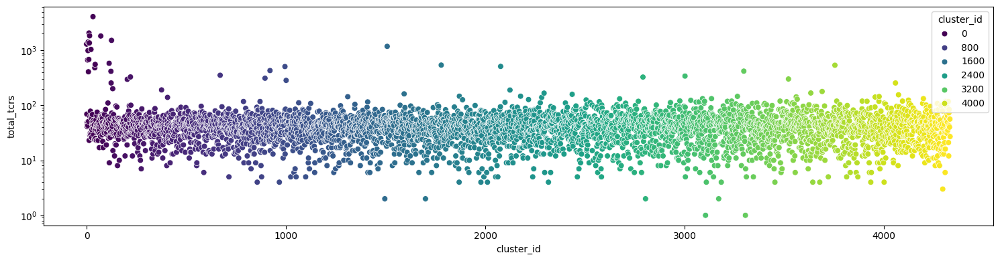

In [7]:
# Get a list of every cluster id (well use it later)
unique_clusters = patient_cluster["cluster_id"].unique()

# Calculate total TCRs per partition
cluster_counts = patient_cluster.groupby('cluster_id').size().reset_index(name='total_tcrs')
display(cluster_counts[:3])

# Get some statistics on what we have
pd.set_option('display.float_format', lambda x: '%.f' % x)

stats = cluster_counts['total_tcrs'].describe()
print(f"Summary Statistics for Total TCRs Across All Clusters:\n"
      f"\tCount: {stats['count']:.0f}\n"
      f"\tMean: {stats['mean']:.2f}\n"
      f"\tStandard Deviation: {stats['std']:.2f}\n"
      f"\tMinimum Value: {stats['min']:.0f}\n"
      f"\t25th Percentile (Q1): {stats['25%']:.2f}\n"
      f"\tMedian (Q2): {stats['50%']:.2f}\n"
      f"\t75th Percentile (Q3): {stats['75%']:.2f}\n"
      f"\tMaximum Value: {stats['max']:.0f}\n")

# Lets plot something nice
plt.figure(figsize=(15, 4))
sns.scatterplot(data=cluster_counts, x='cluster_id', y='total_tcrs', hue='cluster_id', s=40, palette="viridis")
plt.yscale('log')
plt.tight_layout()
plt.show()

In [34]:
min_cluster_size = 120 # 100 leaves us with 121 clusters, 120 with 62
cluster_counts_f = cluster_counts[cluster_counts["total_tcrs"] > min_cluster_size]

# Calculate the percentage of rows kept after filtering
percentage_kept = (len(cluster_counts_f) / len(cluster_counts)) * 100

print("After filtering with a minimum cluster size of", min_cluster_size,
      "\n{:.2f}% of clusters are kept, leaving".format(percentage_kept), len(cluster_counts_f),
      "clusters from the original", len(cluster_counts), "clusters.")

unique_clusters_f = np.array([cluster_id for cluster_id in unique_clusters if cluster_id in cluster_counts_f["cluster_id"].values])


After filtering with a minimum cluster size of 120 
1.43% of clusters are kept, leaving 62 clusters from the original 4333 clusters.


#### Now lets plot the info for each of the clusters

In [48]:
data = unique_clusters, patient_tcrs, patient_cluster, cluster_counts, file_sizes

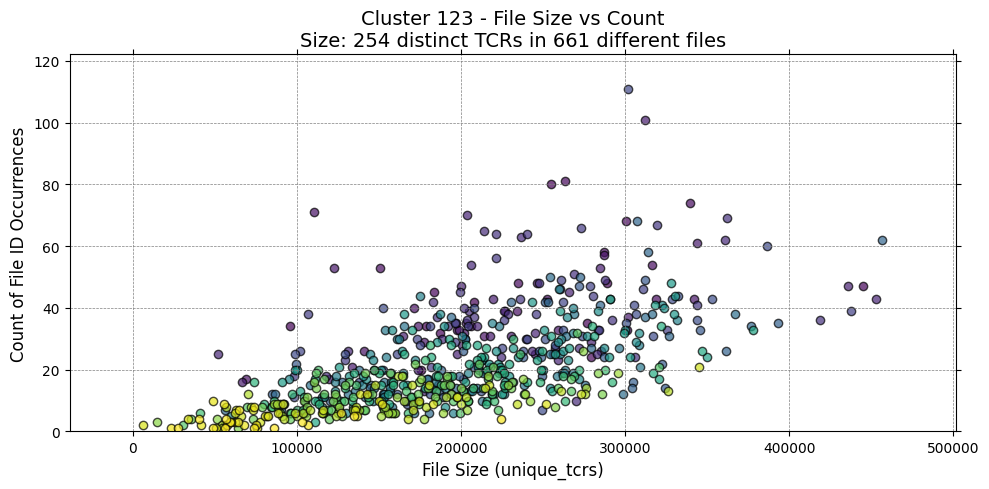

In [12]:
# Option 1 : Print each cluster individually
f.plt_single_graph(data, number_to_plot= 1, rainbow=1)

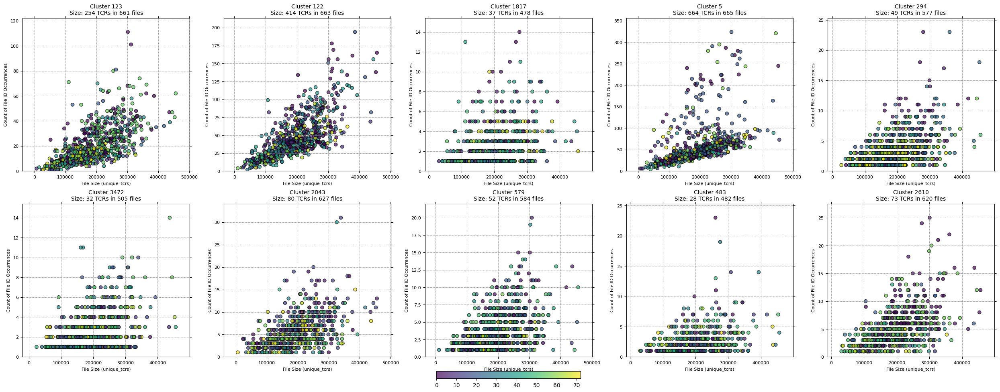

In [36]:
# Option 2: Print a subplot of clusters with counts on the y-axis
cluster_data = f.graph_clusters_subplt(data, num_clusters = 10, plots_per_row = 5,y_axis_as_percentage=False)

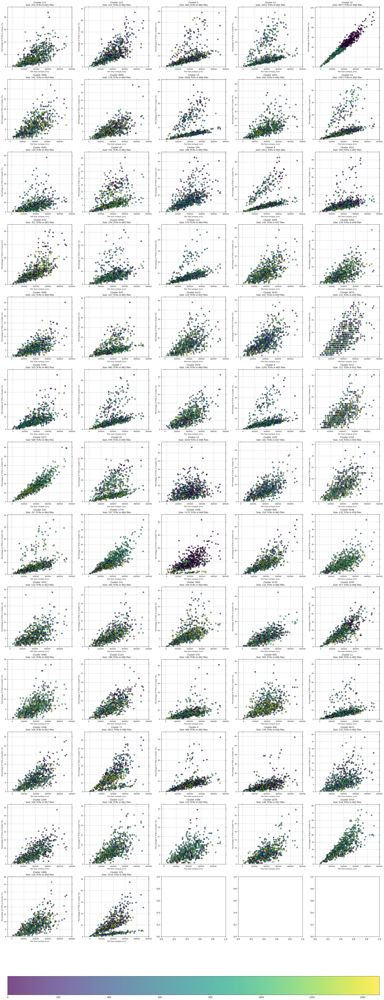

In [49]:
# Option 2: Print a subplot of clusters with percentage in the y-axis
data = unique_clusters_f,patient_tcrs,patient_cluster,cluster_counts,file_sizes # Reduced size, all graphs (62 with 120 as threshold) should print in 7 minutes +-
cluster_data = f.graph_clusters_subplt(data, num_clusters = 65, plots_per_row = 5,y_axis_as_percentage=True)


K-Means clustering

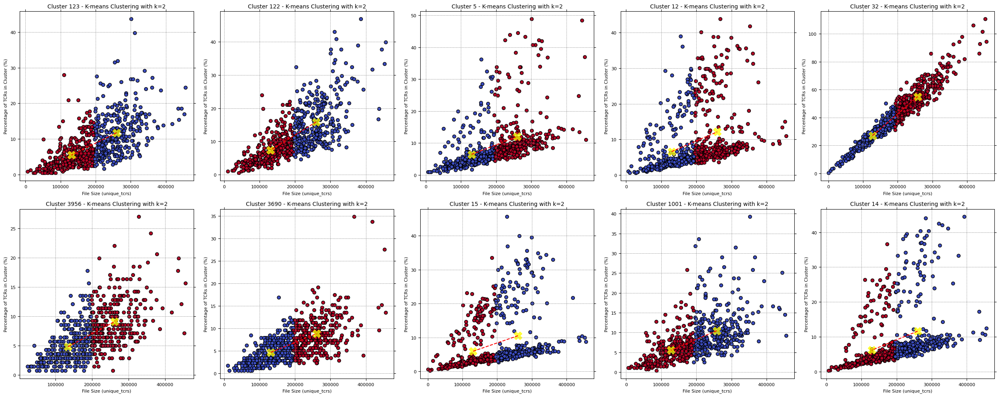

In [87]:
# Apply K-means clustering and plot results
f.apply_kmeans_clustering(cluster_data,n_clusters=2)

DBSCAN clustering

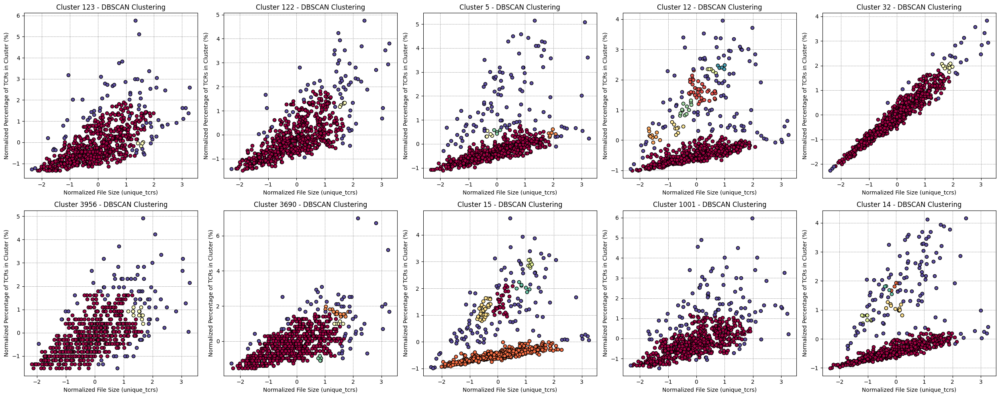

In [70]:
f.apply_dbscan_clustering(cluster_data, eps=0.2, min_samples=5,)

Gaussian mixture fitting

In [65]:
interesting_clusters, gmm_results = f.find_interesting_clusters(cluster_data, threshold = 2, n_components=2)
print(f"With the input parameters {len(interesting_clusters)} interesting clusters have been found")

With the input parameters 20 interesting clusters have been found


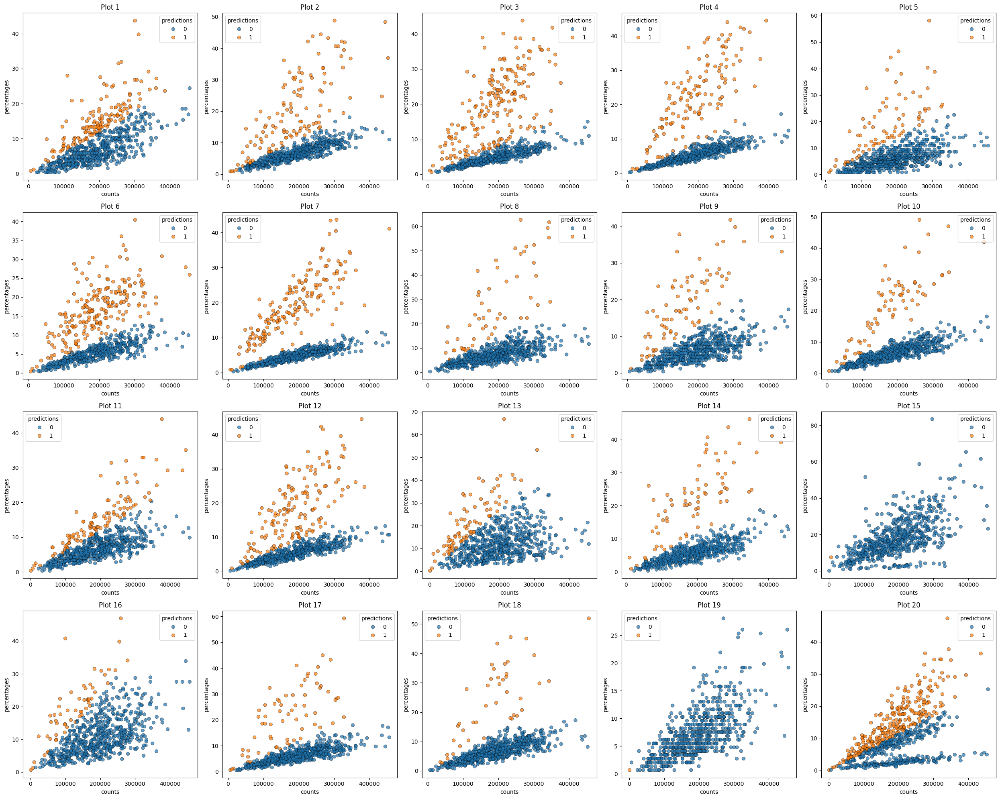

In [64]:
f.plot_predictions(gmm_results,n_columns=5)

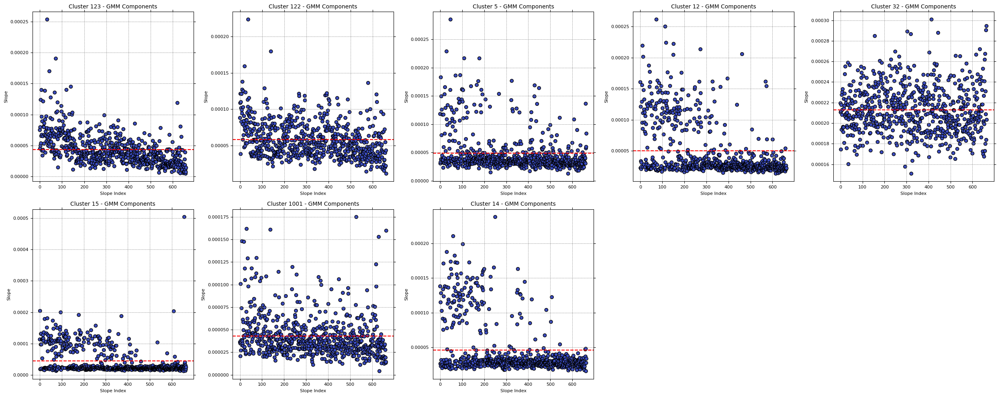

In [55]:
f.plot_gaussian_clusters(cluster_data, gmm_results , plots_per_row=min(len(interesting_clusters), 5))

In [ ]:
f.plot_clusters(data,interesting_clusters)

#### Save results

In [68]:
# Save the list of DataFrames to a file
path_to_save = "../../02-Data/clustering/gmm_results.pkl"
with open(path_to_save, 'wb') as file:
    pickle.dump(gmm_results, file)